# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
%load_ext Cython
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('preprocessed_data.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 21)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'Unnamed: 0.1' 'id' 'teacher_id' 'teacher_prefix'
 'school_state' 'project_submitted_datetime' 'project_grade_category'
 'project_essay_1' 'project_essay_2' 'project_essay_3' 'project_essay_4'
 'project_resource_summary' 'teacher_number_of_previously_posted_projects'
 'project_is_approved' 'clean_categories' 'clean_subcategories'
 'preprocessed_titles' 'preprocessed_essays' 'price' 'quantity']


## 1.2 preprocessing of `project_subject_categories`

## 1.3 preprocessing of `project_subject_subcategories`

## 1.3 Text preprocessing

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

## 1.5 Preparing data for models

In [4]:
project_data.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'id', 'teacher_id', 'teacher_prefix',
       'school_state', 'project_submitted_datetime', 'project_grade_category',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'preprocessed_titles',
       'preprocessed_essays', 'price', 'quantity'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

# Splitting the data into train and test

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [5]:
Y=project_data[['project_is_approved']]
X=project_data[['clean_categories','clean_subcategories','school_state','teacher_prefix','project_grade_category','price','teacher_number_of_previously_posted_projects','preprocessed_titles','preprocessed_essays']]


In [6]:
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
my_counter = Counter()
for word in X['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))
vectorizer1 = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer1.fit(X['clean_categories'].values)
categories_one_hot = vectorizer1.transform(X['clean_categories'].values)
print(vectorizer1.get_feature_names())

print("Shape of matrix after one hot encodig ",categories_one_hot.shape)


['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (109248, 9)


In [7]:
my_counter = Counter()
for word in X['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

vectorizer2 = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer2.fit(X['clean_subcategories'].values)
sub_categories_one_hot = vectorizer2.transform(X['clean_subcategories'].values)
print(vectorizer2.get_feature_names())
print("Shape of matrix after one hot encodig ",sub_categories_one_hot.shape)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig  (109248, 30)


In [8]:
my_counter = Counter()
for word in X['school_state'].values:
    my_counter.update(word.split(','))
    
state_dict = dict(my_counter)
sorted_state_dict = dict(sorted(state_dict.items(), key=lambda kv: kv[1]))

vectorizer3 = CountVectorizer(vocabulary=list(sorted_state_dict.keys()), lowercase=False, binary=True)
vectorizer3.fit(X['school_state'].values)
print(vectorizer3.get_feature_names())


school_state_one_hot = vectorizer3.transform(X['school_state'].values)
print("Shape of matrix after one hot encodig ",school_state_one_hot.shape)


['vt', 'wy', 'nd', 'mt', 'ri', 'sd', 'ne', 'de', 'ak', 'nh', 'wv', 'me', 'hi', 'dc', 'nm', 'ks', 'ia', 'id', 'ar', 'co', 'mn', 'or', 'ky', 'ms', 'nv', 'md', 'ct', 'tn', 'ut', 'al', 'wi', 'va', 'az', 'nj', 'ok', 'wa', 'ma', 'la', 'oh', 'mo', 'in', 'pa', 'mi', 'sc', 'ga', 'il', 'nc', 'fl', 'ny', 'tx', 'ca']
Shape of matrix after one hot encodig  (109248, 51)


In [9]:
X['teacher_prefix']=X['teacher_prefix'].astype(str)


my_counter = Counter()
for word in X['teacher_prefix'].values:
    my_counter.update(word.split(','))
    
tprefix_dict = dict(my_counter)
sorted_tprefix_dict = dict(sorted(tprefix_dict.items(), key=lambda kv: kv[1]))

vectorizer4 = CountVectorizer(vocabulary=list(sorted_tprefix_dict.keys()), lowercase=False, binary=True)
vectorizer4.fit(X['teacher_prefix'].values)
print(vectorizer4.get_feature_names())


teacher_prefix_one_hot = vectorizer4.transform(X['teacher_prefix'].values)
print("Shape of matrix after one hot encodig ",teacher_prefix_one_hot.shape)


['dr', 'teacher', 'mr', 'ms', 'mrs']
Shape of matrix after one hot encodig  (109248, 5)


In [10]:
my_counter = Counter()
for word in X['project_grade_category'].values:
    my_counter.update(word.split(','))
    
project_grade_dict = dict(my_counter)
sorted_project_grade_dict = dict(sorted(project_grade_dict.items(), key=lambda kv: kv[1]))

vectorizer5 = CountVectorizer(vocabulary=list(sorted_project_grade_dict.keys()), lowercase=False, binary=True)
vectorizer5.fit(X['project_grade_category'].values)
print(vectorizer5.get_feature_names())


project_grade_category_one_hot = vectorizer5.transform(X['project_grade_category'].values)
print("Shape of matrix after one hot encodig ",project_grade_category_one_hot.shape)


['grades_9_12', 'grades_6_8', 'grades_3_5', 'grades_prek_2']
Shape of matrix after one hot encodig  (109248, 4)


### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [11]:
'''# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow = vectorizer.fit_transform(preprocessed_essays)
print("Shape of matrix after one hot encodig ",text_bow.shape)'''

'# We are considering only the words which appeared in at least 10 documents(rows or projects).\nvectorizer = CountVectorizer(min_df=10)\ntext_bow = vectorizer.fit_transform(preprocessed_essays)\nprint("Shape of matrix after one hot encodig ",text_bow.shape)'

In [12]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it

#### 1.5.2.2 TFIDF vectorizer

In [13]:
tfevectorizer = TfidfVectorizer()
tfevectorizer.fit(X['preprocessed_essays'].values.astype('U'))
tftvectorizer = TfidfVectorizer()
tftvectorizer.fit(X['preprocessed_titles'].values.astype('U'))

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words=None, strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b', tokenizer=None, use_idf=True,
        vocabulary=None)

In [14]:
text_tfidf = tfevectorizer.transform(X['preprocessed_essays'])
print("Shape of matrix after one hot encodig ",text_tfidf.shape)

Shape of matrix after one hot encodig  (109248, 56215)


In [15]:
title_text_tfidf = tftvectorizer.transform(X['preprocessed_titles'].values.astype('U'))
print("Shape of matrix after one hot encodig ",title_text_tfidf.shape)

Shape of matrix after one hot encodig  (109248, 16745)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [16]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [17]:
'''# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())'''

"# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/\n# make sure you have the glove_vectors file\nwith open('glove_vectors', 'rb') as f:\n    model = pickle.load(f)\n    glove_words =  set(model.keys())"

In [18]:
'''# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))'''

'# average Word2Vec\n# compute average word2vec for each review.\navg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list\nfor sentence in tqdm(preprocessed_essays): # for each review/sentence\n    vector = np.zeros(300) # as word vectors are of zero length\n    cnt_words =0; # num of words with a valid vector in the sentence/review\n    for word in sentence.split(): # for each word in a review/sentence\n        if word in glove_words:\n            vector += model[word]\n            cnt_words += 1\n    if cnt_words != 0:\n        vector /= cnt_words\n    avg_w2v_vectors.append(vector)\n\nprint(len(avg_w2v_vectors))\nprint(len(avg_w2v_vectors[0]))'

#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [19]:
'''# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())'''

'# S = ["abc def pqr", "def def def abc", "pqr pqr def"]\ntfidf_model = TfidfVectorizer()\ntfidf_model.fit(preprocessed_essays)\n# we are converting a dictionary with word as a key, and the idf as a value\ndictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))\ntfidf_words = set(tfidf_model.get_feature_names())'

In [20]:
'''# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))'''

'# average Word2Vec\n# compute average word2vec for each review.\ntfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list\nfor sentence in tqdm(preprocessed_essays): # for each review/sentence\n    vector = np.zeros(300) # as word vectors are of zero length\n    tf_idf_weight =0; # num of words with a valid vector in the sentence/review\n    for word in sentence.split(): # for each word in a review/sentence\n        if (word in glove_words) and (word in tfidf_words):\n            vec = model[word] # getting the vector for each word\n            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))\n            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word\n            vector += (vec * tf_idf) # calculating tfidf weighted w2v\n            tf_idf_weight += tf_idf\n    if tf_idf_weight != 0:\n        vector /= tf_idf_weight\n    tfid

In [21]:
# Similarly you can vectorize for title also

### 1.5.3 Vectorizing Numerical features

In [22]:
'''price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')'''

"price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()\nproject_data = pd.merge(project_data, price_data, on='id', how='left')"

In [23]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(X['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_standardized = price_scalar.transform(X['price'].values.reshape(-1, 1))

Mean : 298.1193425966608, Standard deviation : 367.49634838483496


In [24]:
import warnings
warnings.filterwarnings("ignore")

ppp_scalar = StandardScaler()
ppp_scalar.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {ppp_scalar.mean_[0]}, Standard deviation : {np.sqrt(ppp_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
ppp_standardized = ppp_scalar.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

Mean : 11.153165275336848, Standard deviation : 27.77702641477403


### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [25]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tfidf = hstack((school_state_one_hot, categories_one_hot, sub_categories_one_hot, teacher_prefix_one_hot, project_grade_category_one_hot, price_standardized, ppp_standardized, title_text_tfidf, text_tfidf))
X_tfidf.shape

(109248, 73061)

In [26]:
import pickle
with open('tfidfcluster.pickle', 'wb') as f:
    pickle.dump(X_tfidf, f)

__ Computing Sentiment Scores__

In [27]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features.
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● As this is very computationally expensive, take <b>5k</b> datapoints only to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● Take <b>5k</b> datapoints only.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [28]:
#I will be using tfidf vectorizer model
X_tfidf

<109248x73061 sparse matrix of type '<class 'numpy.float64'>'
	with 12357385 stored elements in COOrdinate format>

In [29]:
X_tfidf=X_tfidf.tocsr()

<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [30]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
X_tfidf_new=SelectKBest(f_classif,k=5000).fit_transform(X_tfidf,Y)

In [31]:
X_tfidf_new

<109248x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 6329517 stored elements in Compressed Sparse Row format>

In [32]:
with open('tfidfcluster.pickle', 'wb') as f:
    pickle.dump([X_tfidf,X_tfidf_new], f)

<h2>2.5 Apply Kmeans</h2>

In [33]:
from sklearn.cluster import KMeans

In [34]:
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [73]:
%%time
nc=[2,3,5,8,10]
ita=[]
for i in nc:
    km=KMeans(n_clusters=i,n_jobs=-1).fit(X_tfidf_new)
    print(km.inertia_,end=' ')
    ita.append(km.inertia_)

546483.4679536711 496584.48209064256 430225.9294233989 379741.54658201826 357181.4356304758 Wall time: 3h 50min 53s


In [75]:
import pickle
with open('kmeans.pickle', 'wb') as f:
    pickle.dump([nc,ita], f)

In [35]:
with open('kmeans.pickle', 'rb') as f:
    nc,ita=pickle.load(f)

Text(0,0.5,'Inertia')

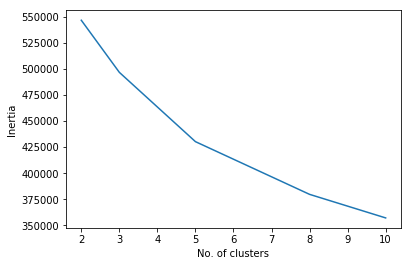

In [36]:
plt.plot(nc,ita)
plt.xlabel('No. of clusters')
plt.ylabel('Inertia')

The best number of clusters is 5

In [37]:
%%time
km1=KMeans(n_clusters=5,n_jobs=-1).fit(X_tfidf_new)

Wall time: 42min 50s


In [38]:
km1.labels_

array([3, 0, 1, ..., 3, 0, 1])

In [39]:
cl0=[]
cl1=[]
cl2=[]
cl3=[]
cl4=[]
for i in range(0,X_tfidf_new.shape[0],1):
    if(km1.labels_[i]==0):
        cl0.append(i)
    elif(km1.labels_[i]==1):
        cl1.append(i)
    elif(km1.labels_[i]==2):
        cl2.append(i)
    elif(km1.labels_[i]==3):
        cl3.append(i)
    elif(km1.labels_[i]==4):
        cl4.append(i)

In [40]:
len(cl0)

34042

In [41]:
len(cl1)

35852

In [42]:
len(cl2)

3619

In [43]:
len(cl3)

30613

In [44]:
len(cl4)

5122

## Plotting Wordcloud

In [67]:
%%time
x0=[]
x1=[]
x2=[]
x3=[]
x4=[]
for i in cl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in cl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in cl2:
    x2.append(X['preprocessed_essays'].values[i])
for i in cl3:
    x3.append(X['preprocessed_essays'].values[i])
for i in cl4:
    x4.append(X['preprocessed_essays'].values[i])    

Wall time: 1.69 s


In [69]:
len(x0)

34042

In [70]:
from wordcloud import WordCloud, STOPWORDS

In [74]:
#We are sampling 1000 data points from each cluster to form the word cloud
rs0=random.sample(x0,1000)
rs1=random.sample(x1,1000)
rs2=random.sample(x2,1000)
rs3=random.sample(x3,1000)
rs4=random.sample(x4,1000)

In [75]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs0
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 54.5 s


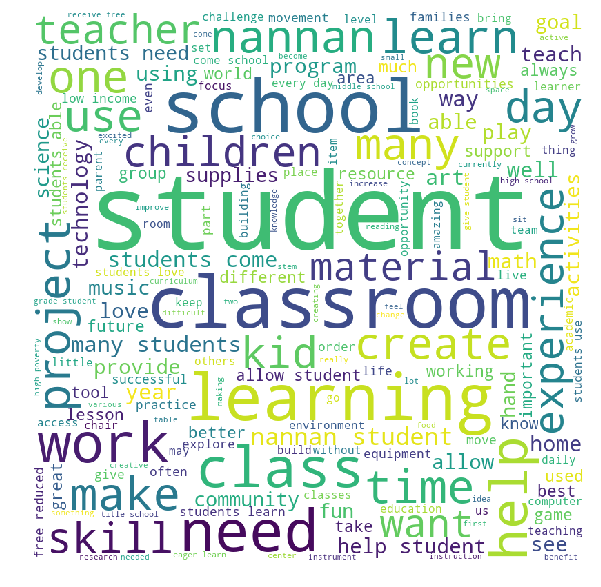

In [76]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [77]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs1
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 44.7 s


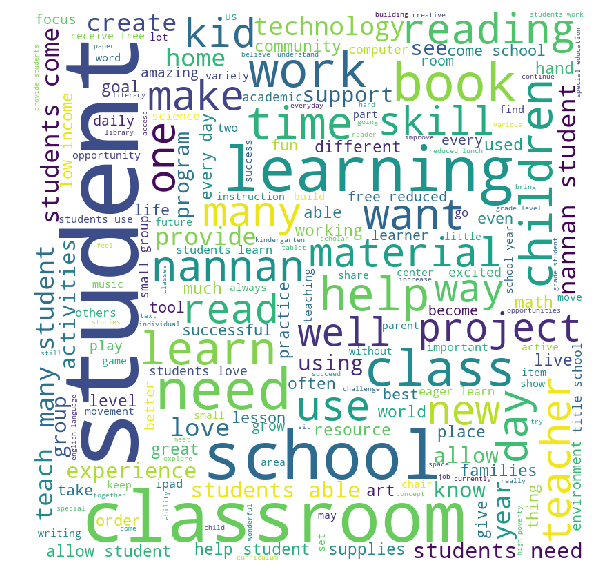

In [78]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [79]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs2
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 48.6 s


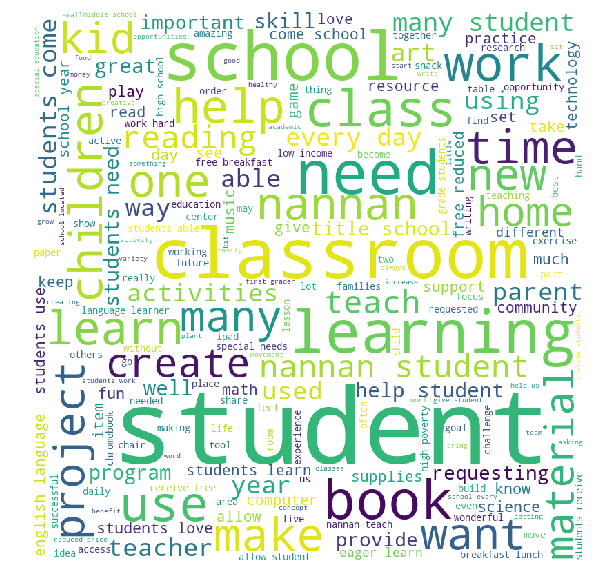

In [80]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [81]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs3
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs3:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 39.5 s


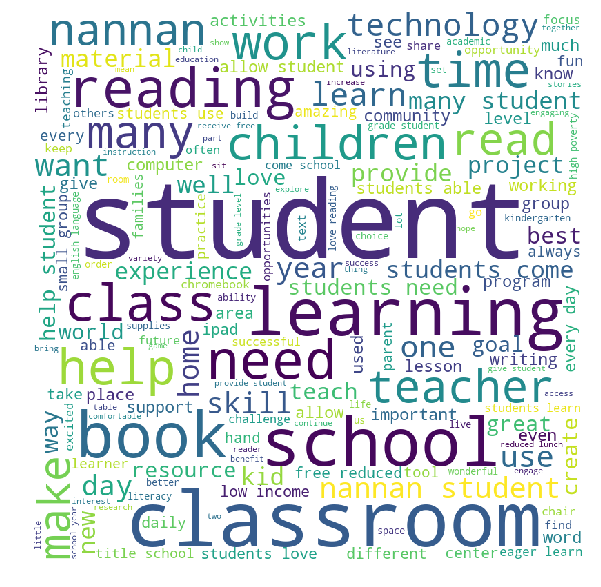

In [82]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [83]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs4
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs4:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 49 s


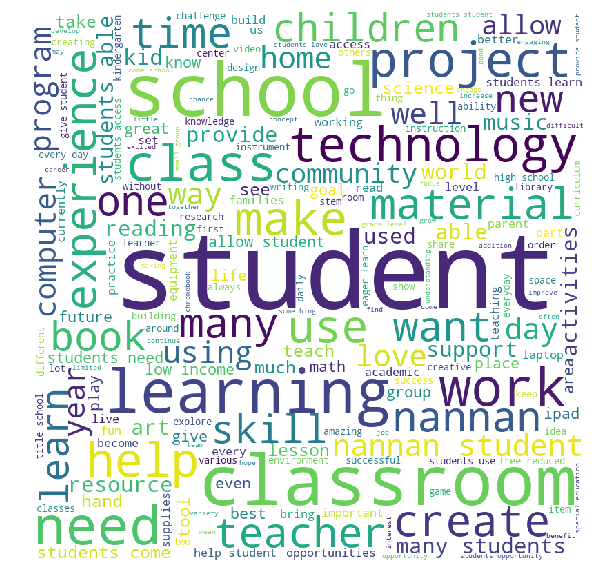

In [84]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

<h2>2.6 Apply AgglomerativeClustering</h2>

In [87]:
X_tfidf_new_reduced=X_tfidf_new[0:5000]

In [96]:
X_tfidf_new_reduced

<5000x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 290698 stored elements in Compressed Sparse Row format>

In [90]:
from sklearn.cluster import AgglomerativeClustering

In [98]:
%%time
ac1=AgglomerativeClustering(n_clusters=2).fit(X_tfidf_new_reduced.toarray())

Wall time: 3min 41s


In [99]:
%%time
ac2=AgglomerativeClustering(n_clusters=3).fit(X_tfidf_new_reduced.toarray())

Wall time: 3min 31s


In [100]:
%%time
ac3=AgglomerativeClustering(n_clusters=5).fit(X_tfidf_new_reduced.toarray())

Wall time: 3min 41s


In [101]:
%%time
ac4=AgglomerativeClustering(n_clusters=8).fit(X_tfidf_new_reduced.toarray())

Wall time: 3min 16s


In [102]:
%%time
ac5=AgglomerativeClustering(n_clusters=10).fit(X_tfidf_new_reduced.toarray())

Wall time: 3min 34s


## Agglomerative Clustering with 2 clusters

In [117]:
acl0=[]
acl1=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(ac1.labels_[i]==0):
        acl0.append(i)
    elif(ac1.labels_[i]==1):
        acl1.append(i)

In [118]:
len(acl1)

365

## Plotting WordCloud

In [119]:
%%time
x0=[]
x1=[]
for i in acl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in acl1:
    x1.append(X['preprocessed_essays'].values[i])

Wall time: 96.1 ms


In [120]:
rs0=random.sample(x0,1000)

In [121]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,rs0
cdef str comment_words = ' ',val,words
cdef list tokens
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 7.01 ms


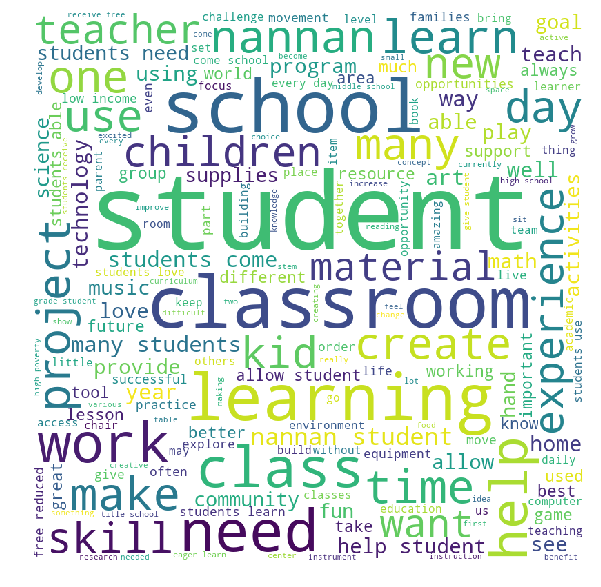

In [122]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [123]:
%%time
%%cython
from __main__ import WordCloud, STOPWORDS,plt,x1
cdef str comment_words = ' ',val,words
cdef list tokens
for val in x1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 7 ms


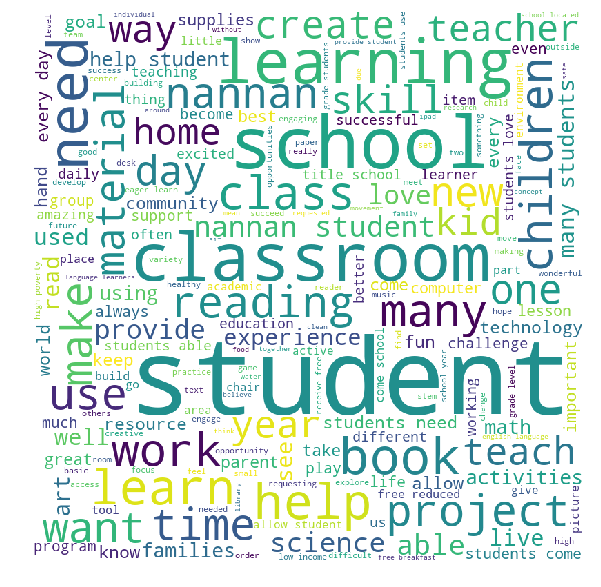

In [124]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

## Agglomerative Clustering with 3 clusters

In [125]:
acl0=[]
acl1=[]
acl2=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(ac2.labels_[i]==0):
        acl0.append(i)
    elif(ac2.labels_[i]==1):
        acl1.append(i)
    elif(ac2.labels_[i]==2):
        acl2.append(i)

In [126]:
%%time
x0=[]
x1=[]
x2=[]
for i in acl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in acl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in acl2:
    x2.append(X['preprocessed_essays'].values[i])    

Wall time: 106 ms


## Plotting WordCloud

In [133]:
rs0=random.sample(x0,1000)

In [139]:
%%time
comment_words=' '
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 24.2 s


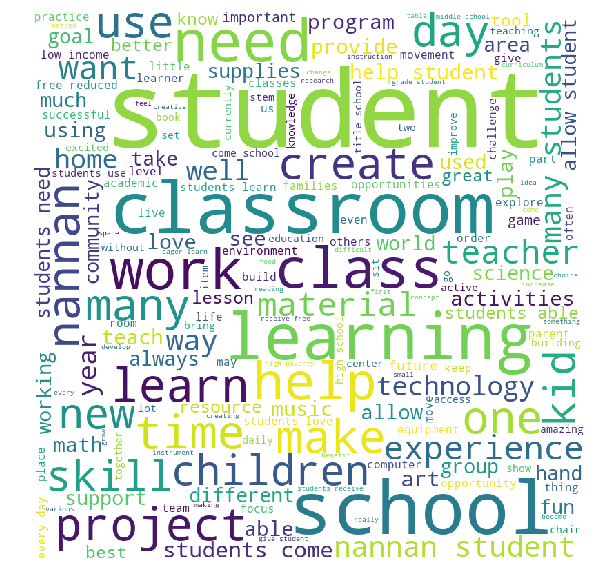

In [140]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [141]:
%%time
comment_words=' '
for val in x1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 7.73 s


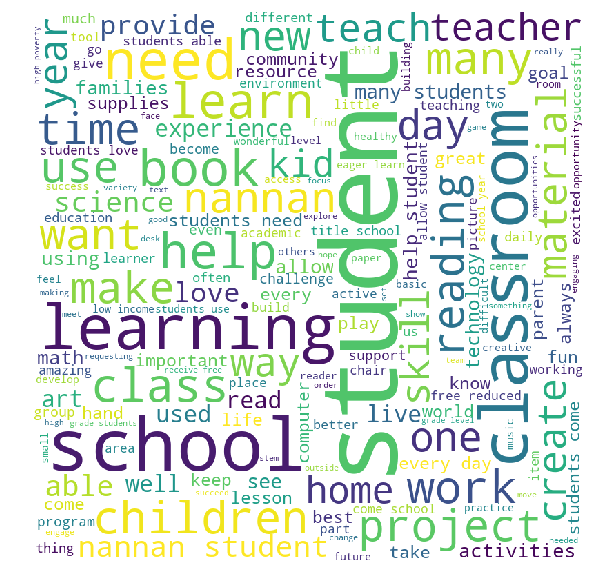

In [142]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [143]:
%%time
comment_words=' '
for val in x2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 10.5 s


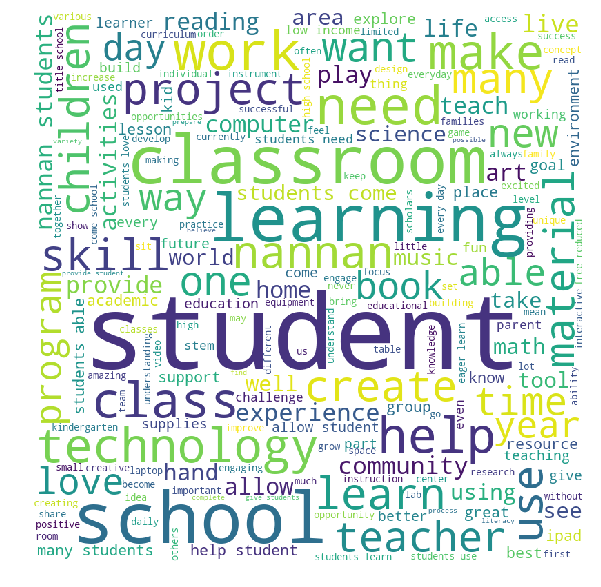

In [144]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

## Agglomerative Clustering with 5 Clusters

In [145]:
acl0=[]
acl1=[]
acl2=[]
acl3=[]
acl4=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(ac3.labels_[i]==0):
        acl0.append(i)
    elif(ac3.labels_[i]==1):
        acl1.append(i)
    elif(ac3.labels_[i]==2):
        acl2.append(i)
    elif(ac3.labels_[i]==3):
        acl3.append(i)
    elif(ac3.labels_[i]==4):
        acl4.append(i)

In [146]:
%%time
x0=[]
x1=[]
x2=[]
x3=[]
x4=[]
for i in acl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in acl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in acl2:
    x2.append(X['preprocessed_essays'].values[i])    
for i in acl3:
    x3.append(X['preprocessed_essays'].values[i])    
for i in acl4:
    x4.append(X['preprocessed_essays'].values[i])    

Wall time: 126 ms


In [159]:
len(x4)

4

## Plotting WordCloud

In [160]:
rs0=random.sample(x0,1000)
rs3=random.sample(x3,1000)

In [161]:
%%time
comment_words=' '
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 23.4 s


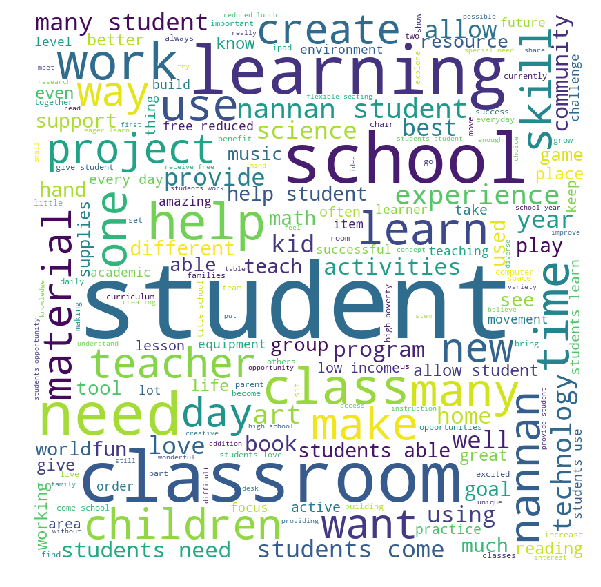

In [162]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [163]:
%%time
comment_words=' '
for val in x1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 8.59 s


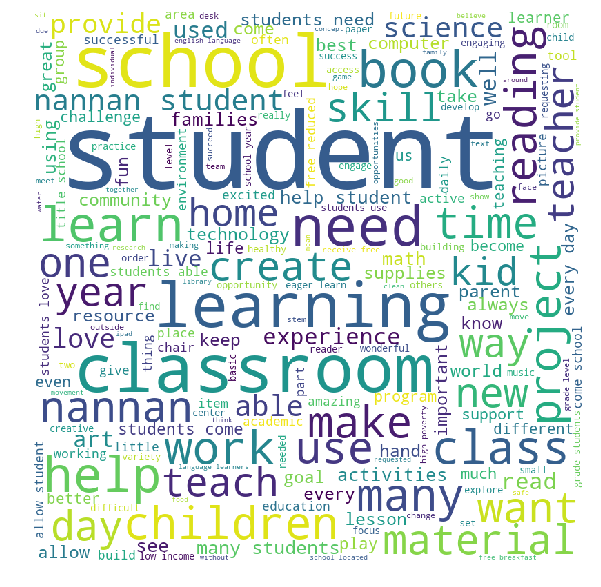

In [164]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [165]:
%%time
comment_words=' '
for val in x2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 7.39 s


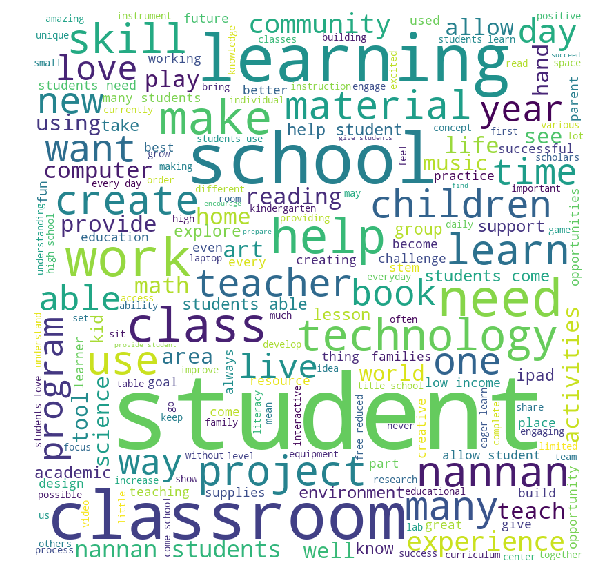

In [166]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [167]:
%%time
comment_words=' '
for val in rs3:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 22.1 s


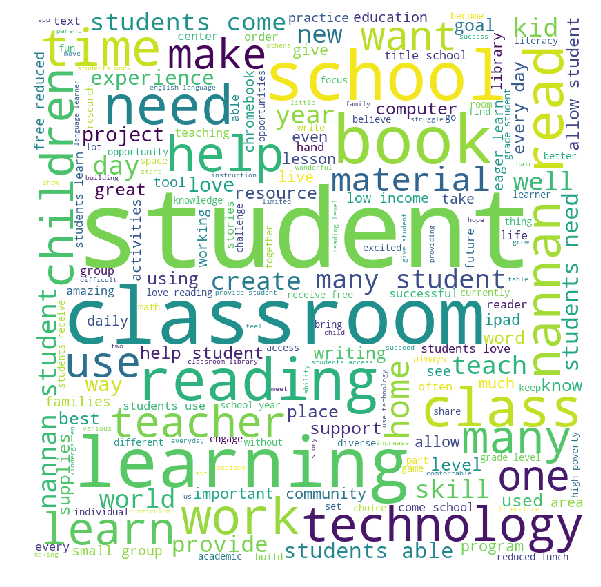

In [168]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [169]:
%%time
comment_words=' '
for val in x4:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 5.23 s


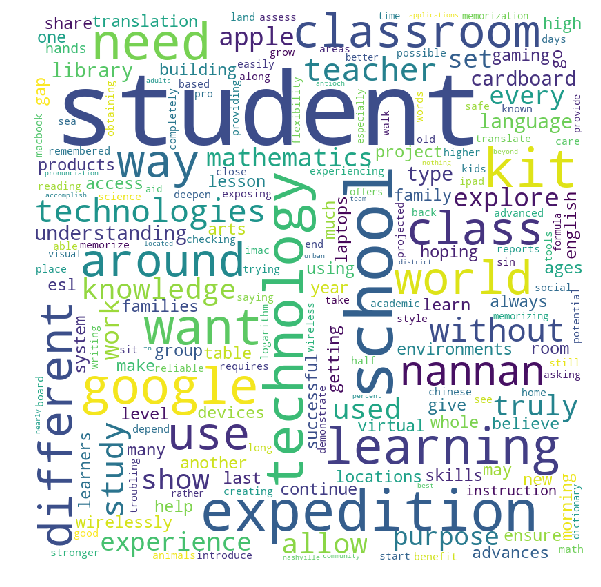

In [170]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

## Agglomerative Clustering with 8 Clusters

In [171]:
acl0=[]
acl1=[]
acl2=[]
acl3=[]
acl4=[]
acl5=[]
acl6=[]
acl7=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(ac4.labels_[i]==0):
        acl0.append(i)
    elif(ac4.labels_[i]==1):
        acl1.append(i)
    elif(ac4.labels_[i]==2):
        acl2.append(i)
    elif(ac4.labels_[i]==3):
        acl3.append(i)
    elif(ac4.labels_[i]==4):
        acl4.append(i)
    elif(ac4.labels_[i]==5):
        acl5.append(i)
    elif(ac4.labels_[i]==6):
        acl6.append(i)
    elif(ac4.labels_[i]==7):
        acl7.append(i)
x0=[]
x1=[]
x2=[]
x3=[]
x4=[]
x5=[]
x6=[]
x7=[]
for i in acl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in acl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in acl2:
    x2.append(X['preprocessed_essays'].values[i])    
for i in acl3:
    x3.append(X['preprocessed_essays'].values[i])    
for i in acl4:
    x4.append(X['preprocessed_essays'].values[i])
for i in acl5:
    x5.append(X['preprocessed_essays'].values[i])
for i in acl6:
    x6.append(X['preprocessed_essays'].values[i])
for i in acl7:
    x7.append(X['preprocessed_essays'].values[i])

In [173]:
print(len(x0))
print(len(x1))
print(len(x2))
print(len(x3))
print(len(x4))
print(len(x5))
print(len(x6))
print(len(x7))

1789
1058
409
334
4
540
31
835


## Plotting WordCloud

In [174]:
rs0=random.sample(x0,1000)
rs1=random.sample(x1,1000)

In [175]:
%%time
comment_words=' '
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 24.4 s


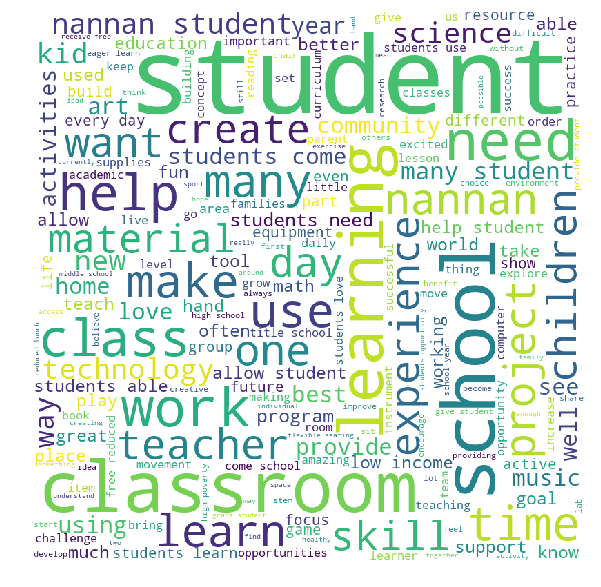

In [176]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [177]:
%%time
comment_words=' '
for val in rs1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 23.1 s


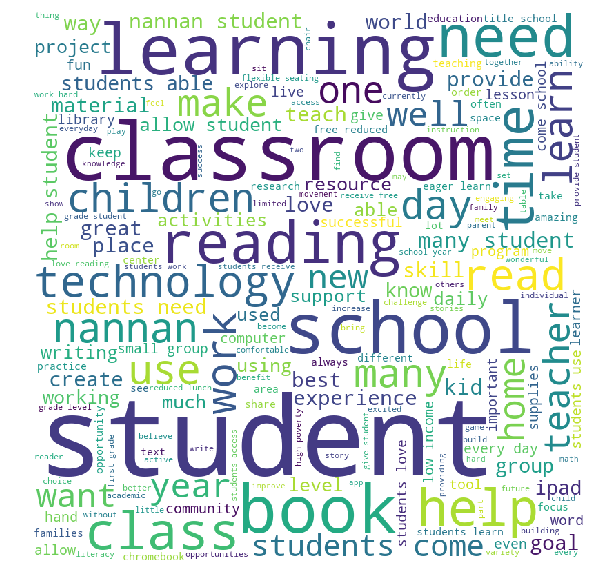

In [178]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [179]:
%%time
comment_words=' '
for val in x2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 9.79 s


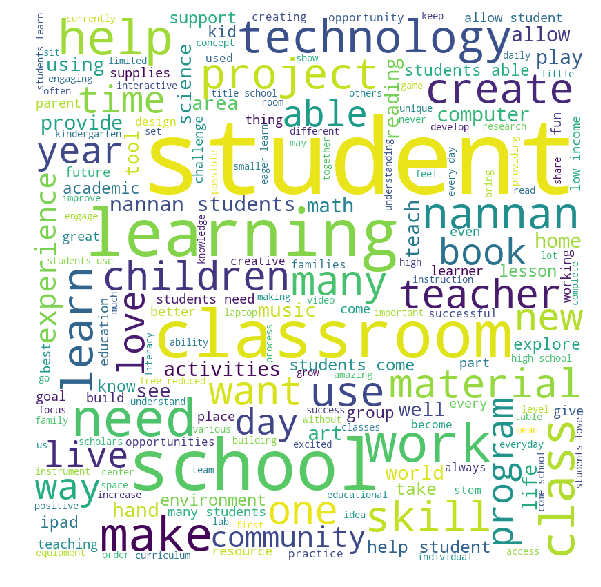

In [180]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [181]:
%%time
comment_words=' '
for val in x3:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 5.94 s


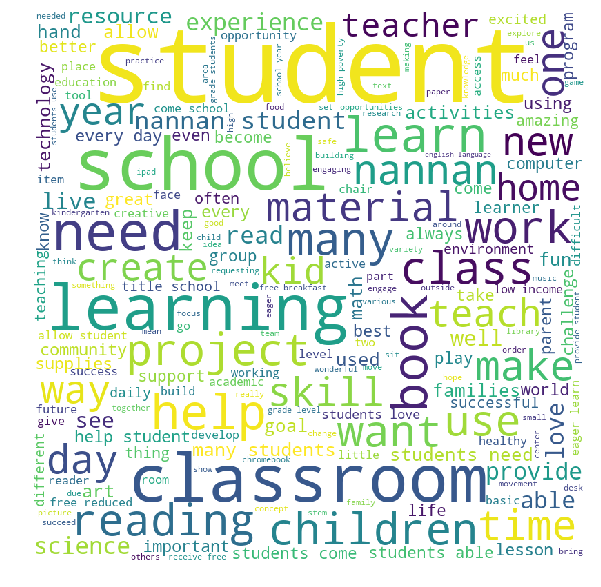

In [182]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [183]:
%%time
comment_words=' '
for val in x4:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 5.34 s


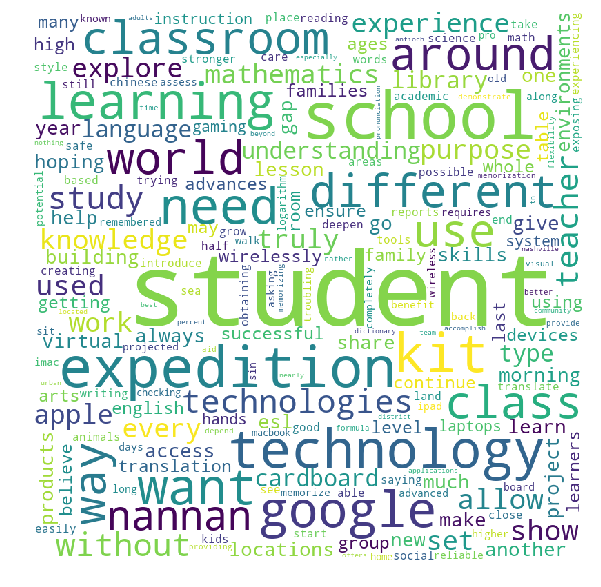

In [184]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [185]:
%%time
comment_words=' '
for val in x5:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 8.11 s


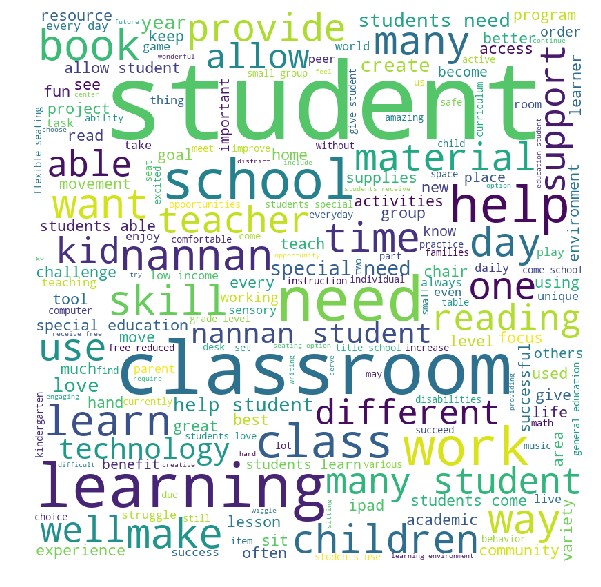

In [186]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [187]:
%%time
comment_words=' '
for val in x6:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 5.59 s


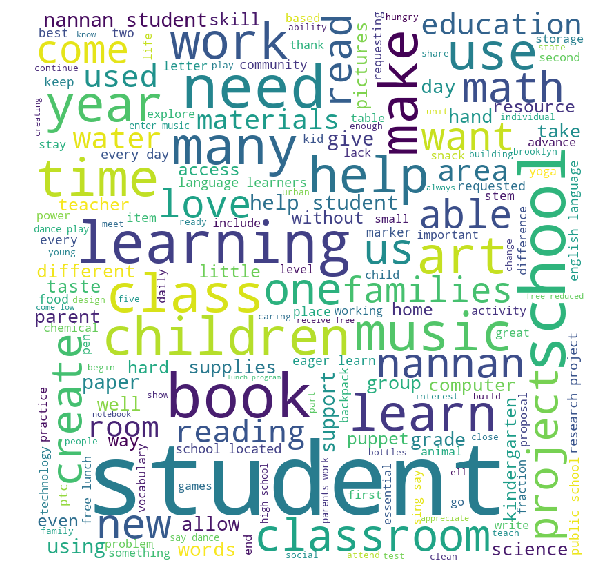

In [188]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

In [189]:
%%time
comment_words=' '
for val in x7:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 

Wall time: 11.7 s


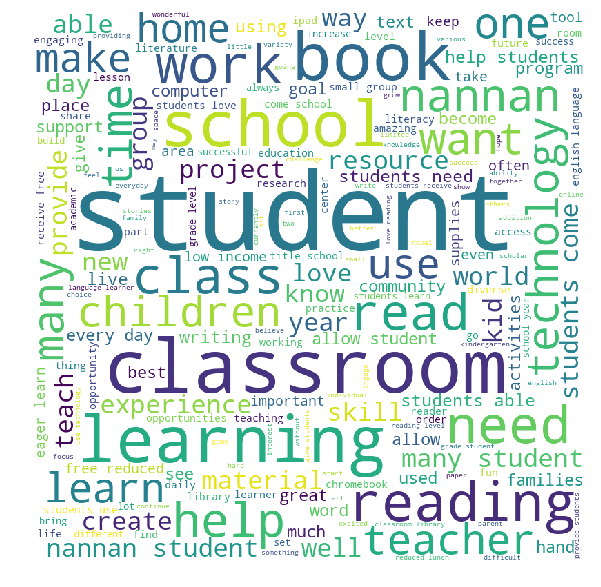

In [190]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

## Agglomerative Clustering with 10 Clusters

In [193]:
acl0=[]
acl1=[]
acl2=[]
acl3=[]
acl4=[]
acl5=[]
acl6=[]
acl7=[]
acl8=[]
acl9=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(ac5.labels_[i]==0):
        acl0.append(i)
    elif(ac5.labels_[i]==1):
        acl1.append(i)
    elif(ac5.labels_[i]==2):
        acl2.append(i)
    elif(ac5.labels_[i]==3):
        acl3.append(i)
    elif(ac5.labels_[i]==4):
        acl4.append(i)
    elif(ac5.labels_[i]==5):
        acl5.append(i)
    elif(ac5.labels_[i]==6):
        acl6.append(i)
    elif(ac5.labels_[i]==7):
        acl7.append(i)
    elif(ac5.labels_[i]==8):
        acl8.append(i)
    elif(ac5.labels_[i]==9):
        acl9.append(i)
x0=[]
x1=[]
x2=[]
x3=[]
x4=[]
x5=[]
x6=[]
x7=[]
x8=[]
x9=[]
for i in acl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in acl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in acl2:
    x2.append(X['preprocessed_essays'].values[i])    
for i in acl3:
    x3.append(X['preprocessed_essays'].values[i])    
for i in acl4:
    x4.append(X['preprocessed_essays'].values[i])
for i in acl5:
    x5.append(X['preprocessed_essays'].values[i])
for i in acl6:
    x6.append(X['preprocessed_essays'].values[i])
for i in acl7:
    x7.append(X['preprocessed_essays'].values[i])
for i in acl8:
    x8.append(X['preprocessed_essays'].values[i])
for i in acl9:
    x9.append(X['preprocessed_essays'].values[i])

In [194]:
print(len(x0))
print(len(x1))
print(len(x2))
print(len(x3))
print(len(x4))
print(len(x5))
print(len(x6))
print(len(x7))
print(len(x8))
print(len(x9))

1058
334
963
826
277
540
31
835
132
4


## Plotting WordCloud

In [195]:
rs0=random.sample(x0,1000)

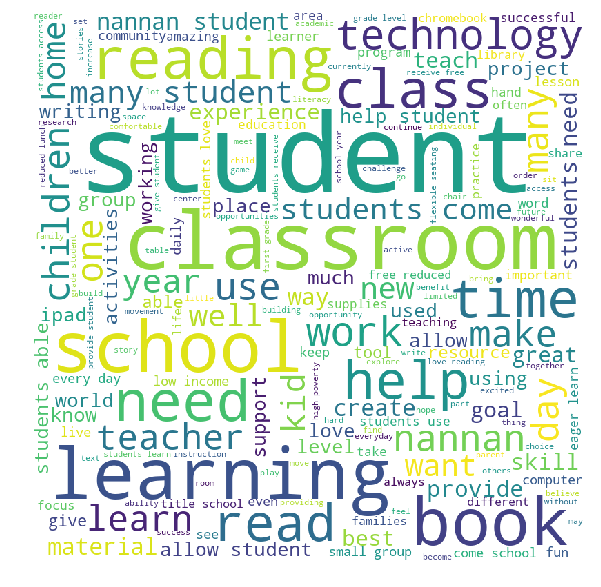

Wall time: 17.1 s


In [196]:
%%time
comment_words=' '
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

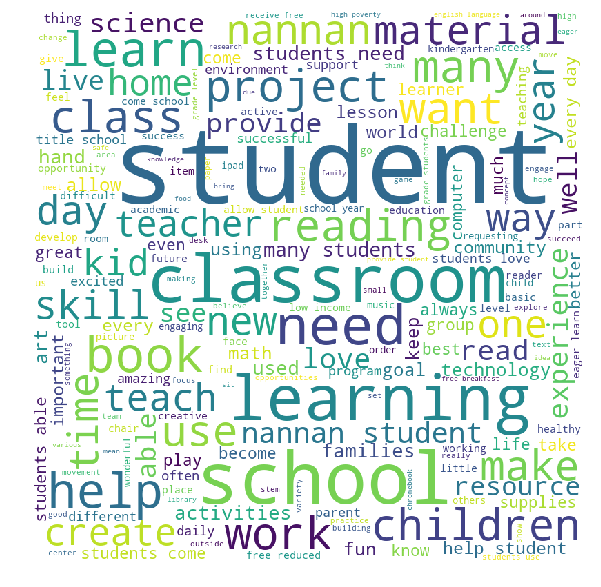

Wall time: 9.15 s


In [197]:
%%time
comment_words=' '
for val in x1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

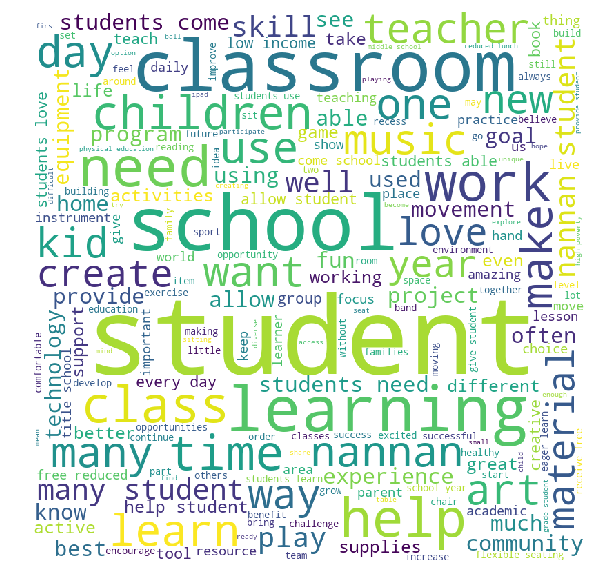

Wall time: 17.8 s


In [198]:
%%time
comment_words=' '
for val in x2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

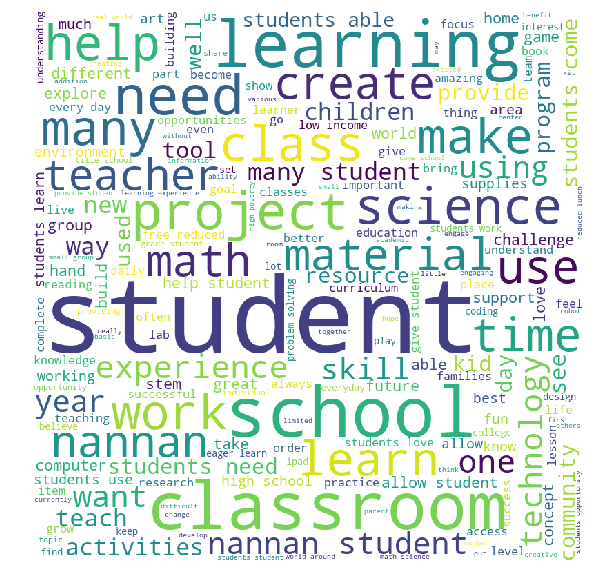

Wall time: 16.8 s


In [199]:
%%time
comment_words=' '
for val in x3:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

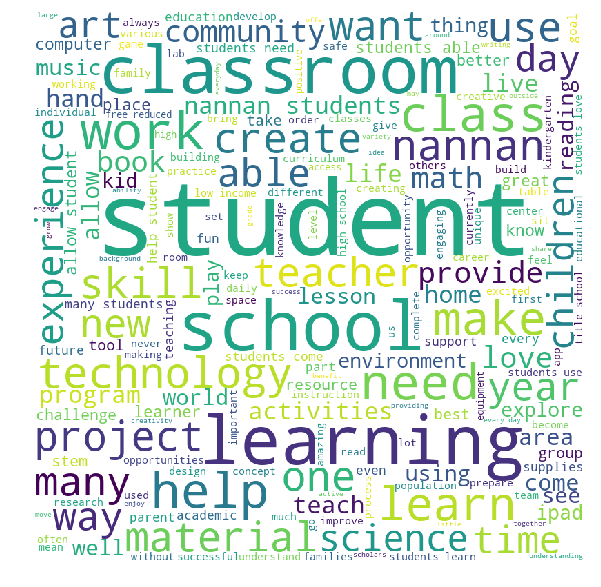

Wall time: 6.89 s


In [200]:
%%time
comment_words=' '
for val in x4:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

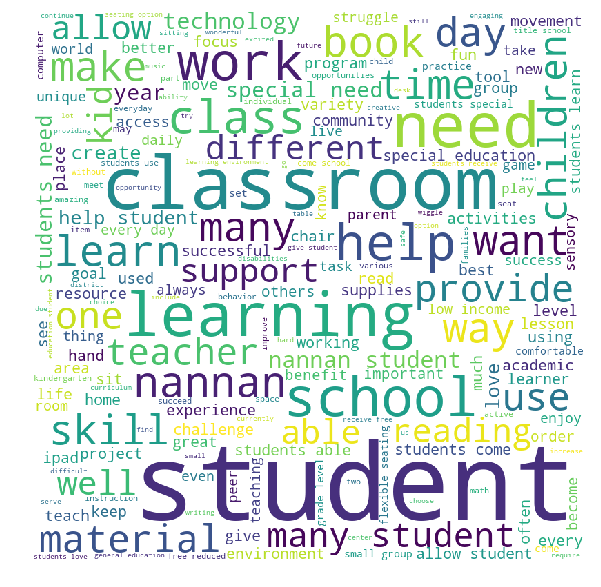

Wall time: 13.8 s


In [201]:
%%time
comment_words=' '
for val in x5:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

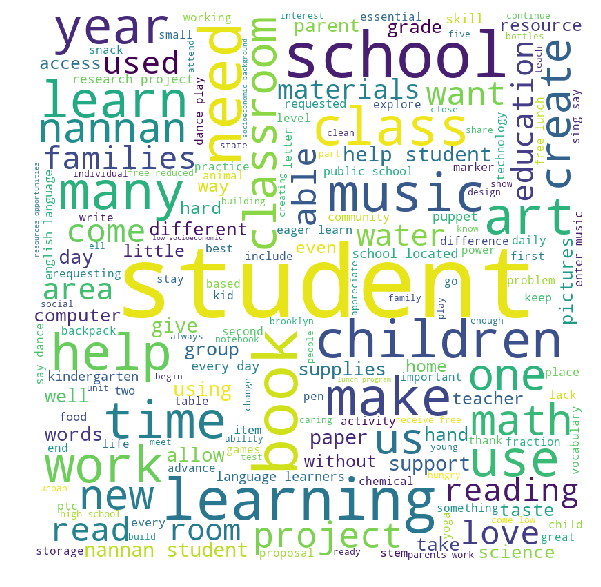

Wall time: 6.16 s


In [202]:
%%time
comment_words=' '
for val in x6:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

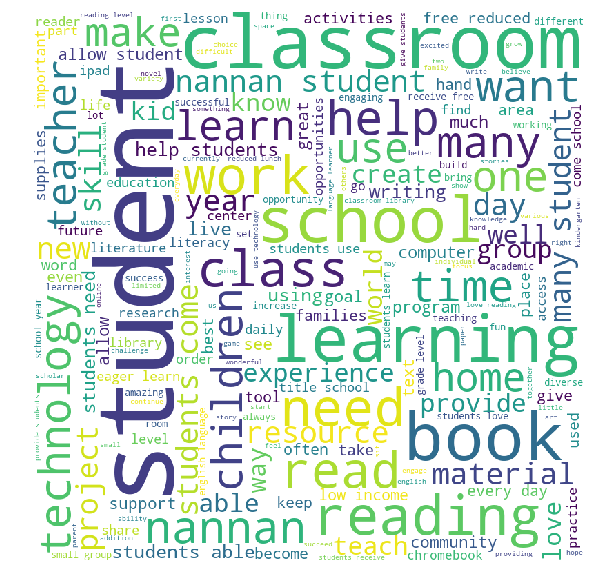

Wall time: 19.8 s


In [203]:
%%time
comment_words=' '
for val in x7:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

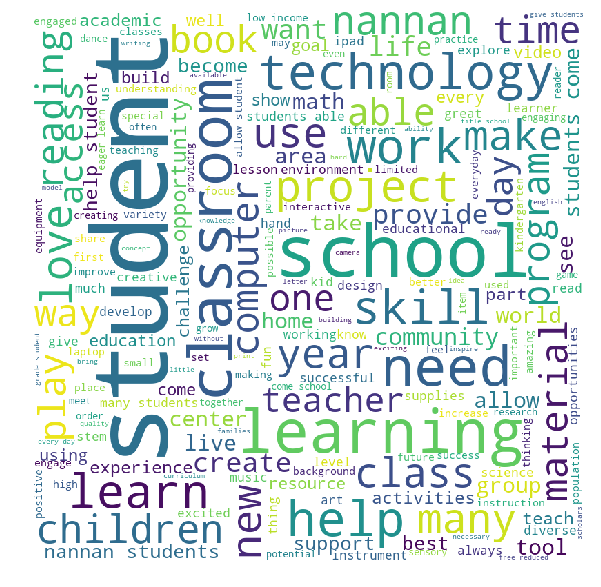

Wall time: 6.06 s


In [204]:
%%time
comment_words=' '
for val in x8:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

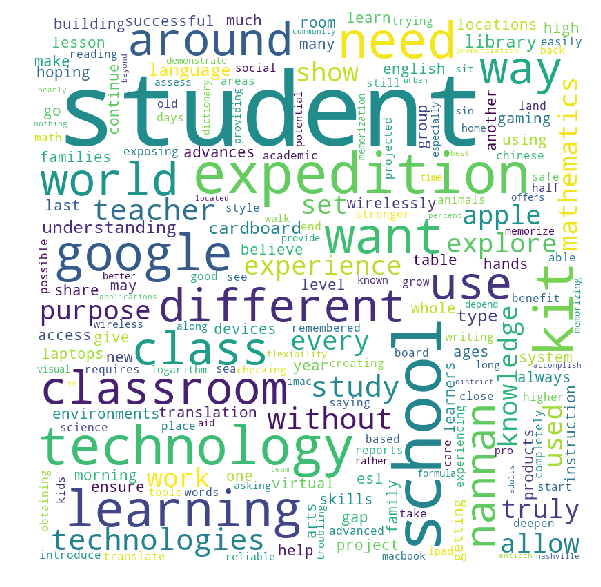

Wall time: 6.61 s


In [205]:
%%time
comment_words=' '
for val in x9:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

<h2>2.7 Apply DBSCAN</h2>

In [206]:
from sklearn.cluster import DBSCAN

In [208]:
X_tfidf_new_reduced

<5000x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 290698 stored elements in Compressed Sparse Row format>

In [255]:
from sklearn.neighbors import NearestNeighbors

In [508]:
%%time
nn=NearestNeighbors(n_neighbors=5000,n_jobs=-1)
nn.fit(X_tfidf_new_reduced)

Wall time: 10.5 ms


In [524]:
distances,indices=nn.kneighbors(X_tfidf_new_reduced)

Text(0,0.5,'eps values')

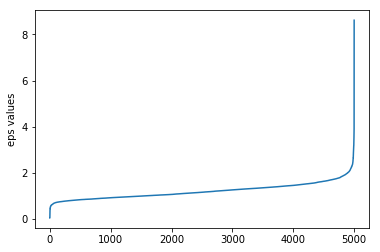

In [525]:
distances=np.sort(distances,axis=0)
distances=distances[:,1]
plt.plot(distances)
plt.ylabel('eps values')

From the above graph, we can see that  2 is the best value for eps

In [526]:
%%time
dbs=DBSCAN(eps=2,n_jobs=-1).fit(X_tfidf_new_reduced)

Wall time: 7.43 s


In [527]:
min(dbs.labels_)

-1

In [529]:
dbcl0=[]
dbcl1=[]
dbcl2=[]
dbcl3=[]
dbcl4=[]
dbcl5=[]
for i in range(0,X_tfidf_new_reduced.shape[0],1):
    if(dbs.labels_[i]==0):
        dbcl0.append(i)
    elif(dbs.labels_[i]==1):
        dbcl1.append(i)
    elif(dbs.labels_[i]==2):
        dbcl2.append(i)
    elif(dbs.labels_[i]==3):
        dbcl3.append(i)
    elif(dbs.labels_[i]==4):
        dbcl4.append(i)
    elif(dbs.labels_[i]==-1):
        dbcl5.append(i)
x0=[]
x1=[]
x2=[]
x3=[]
x4=[]
x5=[]
for i in dbcl0:
    x0.append(X['preprocessed_essays'].values[i])
for i in dbcl1:
    x1.append(X['preprocessed_essays'].values[i])
for i in dbcl2:
    x2.append(X['preprocessed_essays'].values[i])    
for i in dbcl3:
    x3.append(X['preprocessed_essays'].values[i])    
for i in dbcl4:
    x4.append(X['preprocessed_essays'].values[i])
for i in dbcl5:
    x5.append(X['preprocessed_essays'].values[i])

In [535]:
print(len(x0))
print(len(x1))
print(len(x2))
print(len(x3))
print(len(x4))
print(len(x5))

4783
48
5
6
5
153


## Plotting WordCloud

In [536]:
rs0=random.sample(x0,1000)

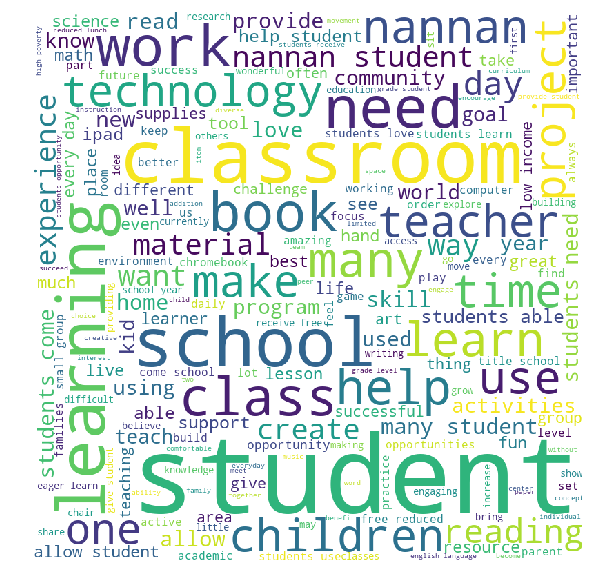

Wall time: 25.9 s


In [537]:
%%time
comment_words=' '
for val in rs0:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

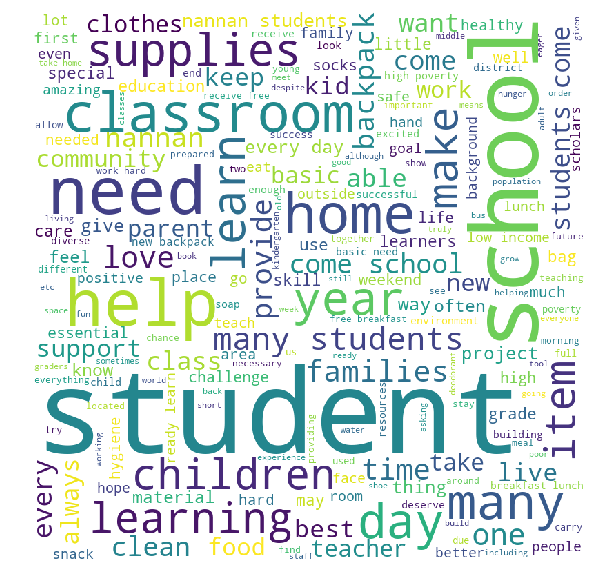

Wall time: 5.2 s


In [538]:
%%time
comment_words=' '
for val in x1:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

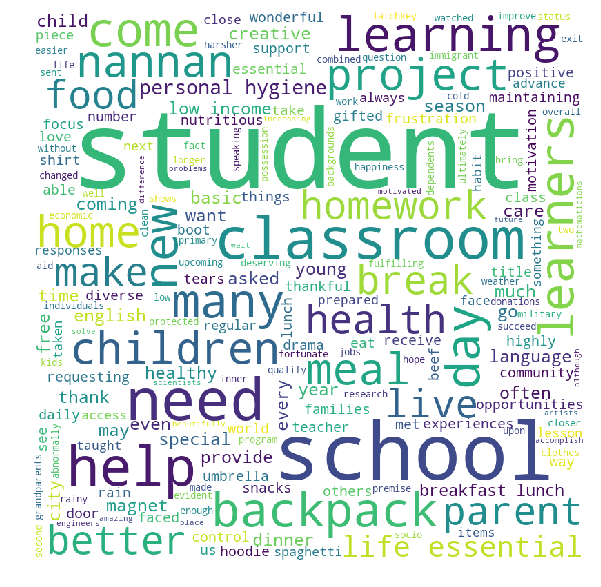

Wall time: 5.49 s


In [539]:
%%time
comment_words=' '
for val in x2:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

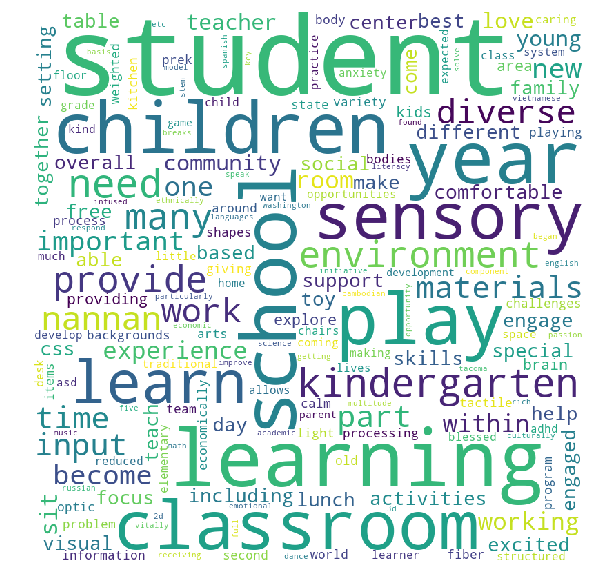

Wall time: 5.54 s


In [540]:
%%time
comment_words=' '
for val in x3:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

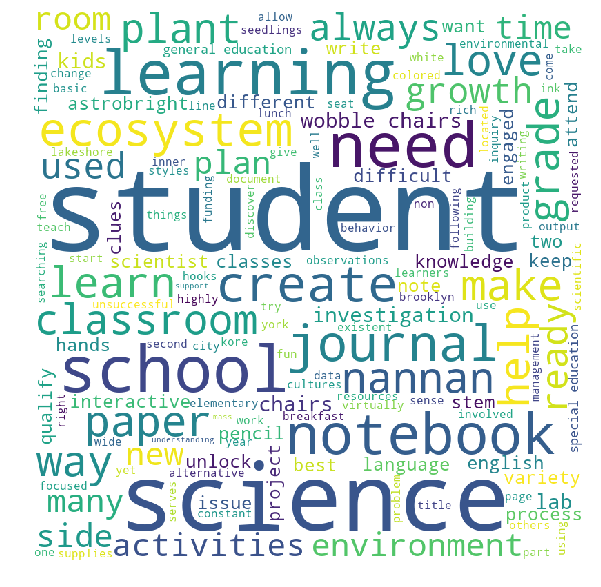

Wall time: 4.96 s


In [541]:
%%time
comment_words=' '
for val in x4:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

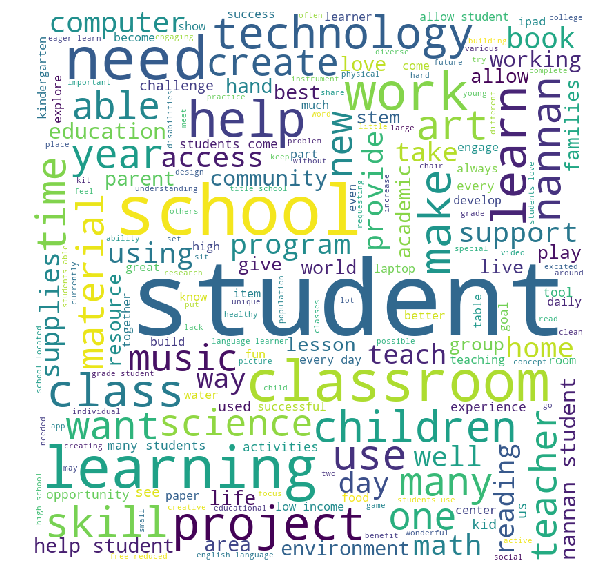

Wall time: 6.92 s


In [542]:
%%time
comment_words=' '
for val in x5:
    val=str(val)
    tokens=val.split()
    for words in tokens: 
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', min_font_size = 10).generate(comment_words) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

__Summary:__

'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur

<h1>3. Conclusions</h1>
<br> Please write down few lines of your observations on this assignment.

I have used tfidf matrix for this assignment.

1. Using elbow method, I have selected n_clusters=5 clusters for KMeans Clustering.

2. I have tried Agglomerative Clustering on the matrix with n_clusters=2,3,5,8 and 10 clusters.

3. Using elbow method, I have selected eps=2 for DBSCAN.

4. There are 153 noisy samples out of 5000 total samples when using DBSCAN.

5. Across all 3 clustering methods, it can be observed that the clusters are not equal in size. Some are large and some are small.

6. 'Student', 'school, 'learning', 'classroom', 'teacher', 'children', 'project', 'reading', 'technology', 'want' and 'need' are some of the most common words that occur in almost all clusters.